In [27]:
import sys
sys.path.append('../scripts')

In [28]:
sys.path.append('../scripts')
# --- Data Classes for Behavioral and Ephys Data ---
from dataclasses import dataclass, field
from typing import List, Dict, Optional, Any
import numpy as np
import scipy.io
import os
import sys

import vis_detect_helpers_EPHYS_August2025 as hp

# from vis_detect_helpers_EPHYS_August2025 import load_session_from_file
from vis_detect_helpers_EPHYS_August2025 import Session, Trial, Cluster



In [29]:
session = hp.load_mat_file_to_session('E:/python_analysis/git_repos/vis_detect_analysis_Sep2025/data/BG_046_13082025.mat')

In [30]:
hp.save_session_to_file(session, 'E:/python_analysis/git_repos/vis_detect_analysis_Sep2025/data/BG_046_13082025.pkl')

In [13]:
session = hp.load_session_from_file('E:/python_analysis/git_repos/vis_detect_analysis_Sep2025/data/BG_046_12082025.pkl')  # Load session data from a file

In [6]:
session.trials[0].trialoutcome  # Accessing trial outcome
# session.clusters[0].cluster_id  # Accessing cluster ID  

'FA'

In [7]:
len(session.clusters[0].spike_times)  # Accessing spike times of the first cluster
# session.clusters[0].quality  # Accessing quality of the first cluster (if

5409

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import os

def get_true_reaction_time(trial, ni_events, trial_idx, shift_fa_hit_ms=200.0):
    outcome = trial.trialoutcome if hasattr(trial, 'trialoutcome') else trial.get('trialoutcome', None)
    reactiontimes = trial.reactiontimes if hasattr(trial, 'reactiontimes') else trial.get('reactiontimes', {})
    # Get Baseline_ON time
    if 'Baseline_ON' in ni_events:
        baseline_on = ni_events['Baseline_ON']
        if isinstance(baseline_on, dict) and 'rise_t' in baseline_on:
            baseline_on_times = np.array(baseline_on['rise_t']).flatten()
        else:
            baseline_on_times = np.array(baseline_on).flatten()
        t0 = baseline_on_times[trial_idx]
    else:
        return None
    # Get Change_ON time (if available)
    if 'Change_ON' in ni_events:
        change_on = ni_events['Change_ON']
        if isinstance(change_on, dict) and 'rise_t' in change_on:
            change_on_times = np.array(change_on['rise_t']).flatten()
        else:
            change_on_times = np.array(change_on).flatten()
        t_change = change_on_times[trial_idx] if trial_idx < len(change_on_times) else None
    else:
        t_change = None
    # Compute true reaction time
    shift = 0.0
    if outcome in ['FA', 'Hit']:
        shift = shift_fa_hit_ms / 1000.0  # convert ms to s
    if outcome == 'Hit':
        rt = reactiontimes.get('RT', np.nan)
        if not np.isnan(rt) and t_change is not None:
            return t_change + rt - shift
        else:
            return None
    elif outcome == 'Miss':
        rt = reactiontimes.get('Miss', np.nan)
        if not np.isnan(rt) and t_change is not None:
            return t_change + rt
        else:
            return None
    elif outcome in ['FA', 'abort']:
        rt = reactiontimes.get(outcome, np.nan)
        if not np.isnan(rt):
            return t0 + rt - shift if outcome == 'FA' else t0 + rt
        else:
            return None
    else:
        return None



In [26]:
# --- Updated PSTH plotting: Change_ON split by change size --- Default smoothing = 50 ms
def plot_psth_per_cluster_per_outcome(
    session, 
    outcomes=None, 
    window=(-0.5, 1.0), 
    bin_size=0.01, 
    good_cluster_ids=None, 
    output_dir='png_output', 
    show_fig=False, 
    min_trials_with_spikes=30, 
    shift_fa_hit_ms=200.0,
    sigma_sec=0.05,  # smoothing in seconds (50 ms)
):
    change_size_colors = {
    1.25: "#FFF2B1",
    1.35: "#ff8c00",
    1.5: "#ff6347",
    2.0: "#e60000",
    4.0: "#990000"
}
    """
    For each good cluster, plot PSTHs for all outcomes (excluding 'Ref'), Baseline_ON, and for Change_ON split by change size.
    """
    import os
    import numpy as np
    import matplotlib.pyplot as plt

    ni_events = getattr(session, 'ni_events', None)
    if ni_events is None:
        print('NI_events not found in session. Cannot align to true event times.')
        return

    # Get all outcomes, exclude 'Ref'
    if outcomes is None:
        outcomes = sorted(set(t.trialoutcome for t in session.trials if t.trialoutcome != 'Ref'))
    else:
        outcomes = [o for o in outcomes if o != 'Ref']

    # Add pseudo-outcomes for Baseline_ON and Change_ON
    extra_alignments = ['Baseline_ON', 'Change_ON']
    all_outcomes = outcomes + extra_alignments

    if good_cluster_ids is None:
        if hasattr(session, 'good_cluster_ids') and session.good_cluster_ids is not None:
            good_cluster_ids = list(session.good_cluster_ids)
        else:
            good_cluster_ids = [c.cluster_id for c in session.clusters]

    os.makedirs(output_dir, exist_ok=True)
    for cluster in session.clusters:
        if cluster.cluster_id not in good_cluster_ids:
            continue
        all_counts_per_outcome = []
        n_trials_per_outcome = []
        for outcome in all_outcomes:
            bins = np.arange(window[0], window[1] + bin_size, bin_size)
            if outcome == 'Change_ON':
                # --- Split by change size, using trial indices to extract correct Change_ON times ---
                change_sizes = sorted(set(t.change_size for t in session.trials if t.change_size is not None))
                if not change_sizes:
                    all_counts_per_outcome.append({})
                    n_trials_per_outcome.append({})
                    continue  # Skip if no change sizes found

                color_map = plt.cm.coolwarm
                norm = plt.Normalize(min(change_sizes), max(change_sizes))
                psth_by_size = {}
                n_trials_by_size = {}
                # Get all Change_ON times from NI_events
                change_on = ni_events['Change_ON']
                if isinstance(change_on, dict) and 'rise_t' in change_on:
                    change_on_times = np.array(change_on['rise_t']).flatten()
                else:
                    change_on_times = np.array(change_on).flatten()
                for cs in change_sizes:
                    # Get indices of trials with this change size
                    trial_indices = [i for i, t in enumerate(session.trials) if t.change_size == cs]
                    event_times = change_on_times[trial_indices] if len(trial_indices) > 0 else []
                    all_counts = []
                    for t_event in event_times:
                        aligned_spikes = cluster.spike_times - t_event
                        mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                        counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                        # apply smoothing in bins if requested
                        try:
                            from scipy.ndimage import gaussian_filter1d
                            sigma_bins = max(0.0, float(sigma_sec) / float(bin_size))
                            if sigma_bins > 0:
                                counts = gaussian_filter1d(counts, sigma=sigma_bins)
                        except Exception:
                            pass
                        all_counts.append(counts)
                    if len(all_counts) == 0:
                        mean_psth = np.zeros(len(bins)-1)
                    else:
                        mean_psth = np.mean(np.array(all_counts), axis=0) / bin_size
                    psth_by_size[cs] = mean_psth
                    n_trials_by_size[cs] = len(event_times)
                all_counts_per_outcome.append(psth_by_size)
                n_trials_per_outcome.append(n_trials_by_size)

            elif outcome == 'Baseline_ON':
                # --- Use trial indices to extract correct Baseline_ON times ---
                baseline_on = ni_events['Baseline_ON']
                if isinstance(baseline_on, dict) and 'rise_t' in baseline_on:
                    baseline_on_times = np.array(baseline_on['rise_t']).flatten()
                else:
                    baseline_on_times = np.array(baseline_on).flatten()
                trial_indices = list(range(len(session.trials)))
                event_times = baseline_on_times[trial_indices] if len(trial_indices) > 0 else []
                all_counts = []
                for t_event in event_times:
                    aligned_spikes = cluster.spike_times - t_event
                    mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                    counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                    try:
                        from scipy.ndimage import gaussian_filter1d
                        sigma_bins = max(0.0, float(sigma_sec) / float(bin_size))
                        if sigma_bins > 0:
                            counts = gaussian_filter1d(counts, sigma=sigma_bins)
                    except Exception:
                        pass
                    all_counts.append(counts)
                if len(all_counts) == 0:
                    all_counts = np.empty((0, len(bins)-1))
                else:
                    all_counts = np.atleast_2d(np.array(all_counts))
                all_counts_per_outcome.append(all_counts)
                n_trials_per_outcome.append(len(event_times))
            else:
                # Align to behavioral outcome as before
                event_times = []
                for idx, t in enumerate(session.trials):
                    if t.trialoutcome == outcome:
                        et = get_true_reaction_time(t, ni_events, idx, shift_fa_hit_ms=shift_fa_hit_ms)
                        if et is not None and not np.isnan(et):
                            event_times.append(et)
                all_counts = []
                for t_event in event_times:
                    aligned_spikes = cluster.spike_times - t_event
                    mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                    counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                    try:
                        from scipy.ndimage import gaussian_filter1d
                        sigma_bins = max(0.0, float(sigma_sec) / float(bin_size))
                        if sigma_bins > 0:
                            counts = gaussian_filter1d(counts, sigma=sigma_bins)
                    except Exception:
                        pass
                    all_counts.append(counts)
                if len(all_counts) == 0:
                    all_counts = np.empty((0, len(bins)-1))
                else:
                    all_counts = np.atleast_2d(np.array(all_counts))
                all_counts_per_outcome.append(all_counts)
                n_trials_per_outcome.append(len(event_times))
        # Robust check for enough spikes (skip for Change_ON since it's dict)
        enough_spikes = False
        for i, counts in enumerate(all_counts_per_outcome):
            if all_outcomes[i] == 'Change_ON':
                if any(n >= min_trials_with_spikes for n in n_trials_per_outcome[i].values()):
                    enough_spikes = True
            else:
                if counts.shape[0] > 0 and np.sum(np.sum(counts, axis=1) > 0) >= min_trials_with_spikes:
                    enough_spikes = True
        if not enough_spikes:
            continue
        fig, axes = plt.subplots(1, len(all_outcomes), figsize=(3*len(all_outcomes), 3), sharey=False)
        if len(all_outcomes) == 1:
            axes = [axes]
        for i, (outcome, counts, n_trials) in enumerate(zip(all_outcomes, all_counts_per_outcome, n_trials_per_outcome)):
            bins = np.arange(window[0], window[1] + bin_size, bin_size)
            ax = axes[i]
            if outcome == 'Change_ON':
                # Plot one line per change size
                for cs in sorted(counts.keys()):
                    if cs == 1:  # No change, keep default color
                        color = 'b'
                    else:
                        color = change_size_colors.get(cs, 'k')  # fallback to black if not found
                    label = f'{cs} Hz (n={n_trials[cs]})'
                    ax.plot(bins[:-1], counts[cs], color=color, label=label)
                # ax.legend(fontsize=8)
            else:
                if counts.shape[0] > 0:
                    mean_psth = np.mean(counts, axis=0) / bin_size
                    ax.step(bins[:-1], mean_psth, where='post', color='k')
            ax.axvline(0, color='r', linestyle='--', lw=0.8)
            ax.set_title(f'{outcome}')
            ax.set_xlabel('Time from event (s)')
            if i == 0:
                ax.set_ylabel('Firing rate (Hz)')
        fig.suptitle(f'Cluster {cluster.cluster_id}')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        save_path = os.path.join(output_dir, f'cluster_{cluster.cluster_id}_psth.png')
        plt.savefig(save_path, dpi=120)
        if show_fig:
            plt.show()
        plt.close(fig)


In [27]:
# --- Updated PSTH plotting: Change_ON split by change size --- W smoothing (50 ms default)
def plot_psth_per_cluster_per_outcome(
    session, 
    outcomes=None, 
    window=(-0.5, 1.0), 
    bin_size=0.05, 
    good_cluster_ids=None, 
    output_dir='png_output', 
    show_fig=False, 
    min_trials_with_spikes=30, 
    shift_fa_hit_ms=200.0,
    sigma_sec=0.05,  # smoothing in seconds (50 ms)
):
    change_size_colors = {
    1.25: "#FFF2B1",
    1.35: "#ff8c00",
    1.5: "#ff6347",
    2.0: "#e60000",
    4.0: "#990000"
}
    
    """
    For each good cluster, plot PSTHs for all outcomes (excluding 'Ref'), Baseline_ON, and for Change_ON split by change size.
    """
    import os
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.ndimage import gaussian_filter1d

    # Set your smoothing parameter (adjust as needed)
    # sigma_sec is provided in seconds; convert to bins for gaussian_filter1d
    sigma_bins_default = max(0.0, float(sigma_sec) / float(bin_size))

    ni_events = getattr(session, 'ni_events', None)
    if ni_events is None:
        print('NI_events not found in session. Cannot align to true event times.')
        return

    # Get all outcomes, exclude 'Ref'
    if outcomes is None:
        outcomes = sorted(set(t.trialoutcome for t in session.trials if t.trialoutcome != 'Ref'))
    else:
        outcomes = [o for o in outcomes if o != 'Ref']

    # Add pseudo-outcomes for Baseline_ON and Change_ON
    extra_alignments = ['Baseline_ON', 'Change_ON']
    all_outcomes = outcomes + extra_alignments

    if good_cluster_ids is None:
        if hasattr(session, 'good_cluster_ids') and session.good_cluster_ids is not None:
            good_cluster_ids = list(session.good_cluster_ids)
        else:
            good_cluster_ids = [c.cluster_id for c in session.clusters]

    os.makedirs(output_dir, exist_ok=True)
    for cluster in session.clusters:
        if cluster.cluster_id not in good_cluster_ids:
            continue
        ### testing  - run only for one cluster
        # if cluster.cluster_id != 186:
        #     continue
        ###
        all_counts_per_outcome = []
        n_trials_per_outcome = []
        for outcome in all_outcomes:
            bins = np.arange(window[0], window[1] + bin_size, bin_size)
            if outcome == 'Change_ON':
                # --- Split by change size, using trial indices to extract correct Change_ON times ---
                change_sizes = sorted(set(t.change_size for t in session.trials if t.change_size is not None))
                if not change_sizes:
                    all_counts_per_outcome.append({})
                    n_trials_per_outcome.append({})
                    continue  # Skip if no change sizes found

                color_map = plt.cm.coolwarm
                norm = plt.Normalize(min(change_sizes), max(change_sizes))
                psth_by_size = {}
                n_trials_by_size = {}
                # Get all Change_ON times from NI_events
                change_on = ni_events['Change_ON']
                if isinstance(change_on, dict) and 'rise_t' in change_on:
                    change_on_times = np.array(change_on['rise_t']).flatten()
                else:
                    change_on_times = np.array(change_on).flatten()
                for cs in change_sizes:
                    # Get indices of trials with this change size
                    trial_indices = [i for i, t in enumerate(session.trials) if t.change_size == cs]
                    event_times = change_on_times[trial_indices] if len(trial_indices) > 0 else []
                    all_counts = []
                    for t_event in event_times:
                        aligned_spikes = cluster.spike_times - t_event
                        mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                        counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                        sigma_bins = max(0.0, float(sigma_sec) / float(bin_size))
                        if sigma_bins > 0:
                            counts = gaussian_filter1d(counts, sigma=sigma_bins)
                        all_counts.append(counts)
                    if len(all_counts) == 0:
                        mean_psth = np.zeros(len(bins)-1)
                    else:
                        mean_psth = np.mean(np.array(all_counts), axis=0) / bin_size
                    psth_by_size[cs] = mean_psth
                    n_trials_by_size[cs] = len(event_times)
                all_counts_per_outcome.append(psth_by_size)
                n_trials_per_outcome.append(n_trials_by_size)

            elif outcome == 'Baseline_ON':
                # --- Use trial indices to extract correct Baseline_ON times ---
                baseline_on = ni_events['Baseline_ON']
                if isinstance(baseline_on, dict) and 'rise_t' in baseline_on:
                    baseline_on_times = np.array(baseline_on['rise_t']).flatten()
                else:
                    baseline_on_times = np.array(baseline_on).flatten()
                trial_indices = list(range(len(session.trials)))
                event_times = baseline_on_times[trial_indices] if len(trial_indices) > 0 else []
                all_counts = []
                for t_event in event_times:
                    aligned_spikes = cluster.spike_times - t_event
                    mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                    counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                    sigma_bins = max(0.0, float(sigma_sec) / float(bin_size))
                    if sigma_bins > 0:
                        counts = gaussian_filter1d(counts, sigma=sigma_bins)
                    all_counts.append(counts)
                if len(all_counts) == 0:
                    all_counts = np.empty((0, len(bins)-1))
                else:
                    all_counts = np.atleast_2d(np.array(all_counts))
                all_counts_per_outcome.append(all_counts)
                n_trials_per_outcome.append(len(event_times))
            else:
                # Align to behavioral outcome as before
                event_times = []
                for idx, t in enumerate(session.trials):
                    if t.trialoutcome == outcome:
                        et = get_true_reaction_time(t, ni_events, idx, shift_fa_hit_ms=shift_fa_hit_ms)
                        if et is not None and not np.isnan(et):
                            event_times.append(et)
                all_counts = []
                for t_event in event_times:
                    aligned_spikes = cluster.spike_times - t_event
                    mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                    counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                    sigma_bins = max(0.0, float(sigma_sec) / float(bin_size))
                    if sigma_bins > 0:
                        counts = gaussian_filter1d(counts, sigma=sigma_bins)
                    all_counts.append(counts)
                if len(all_counts) == 0:
                    all_counts = np.empty((0, len(bins)-1))
                else:
                    all_counts = np.atleast_2d(np.array(all_counts))
                all_counts_per_outcome.append(all_counts)
                n_trials_per_outcome.append(len(event_times))
        # Robust check for enough spikes (skip for Change_ON since it's dict)
        enough_spikes = False
        for i, counts in enumerate(all_counts_per_outcome):
            if all_outcomes[i] == 'Change_ON':
                if any(n >= min_trials_with_spikes for n in n_trials_per_outcome[i].values()):
                    enough_spikes = True
            else:
                if counts.shape[0] > 0 and np.sum(np.sum(counts, axis=1) > 0) >= min_trials_with_spikes:
                    enough_spikes = True
        if not enough_spikes:
            continue
        fig, axes = plt.subplots(1, len(all_outcomes), figsize=(3*len(all_outcomes), 3), sharey=False)
        if len(all_outcomes) == 1:
            axes = [axes]
        for i, (outcome, counts, n_trials) in enumerate(zip(all_outcomes, all_counts_per_outcome, n_trials_per_outcome)):
            bins = np.arange(window[0], window[1] + bin_size, bin_size)
            ax = axes[i]
            if outcome == 'Change_ON':
                # Plot one line per change size
                for cs in sorted(counts.keys()):
                    if cs == 1:  # No change, keep default color
                        color = 'b'
                    else:
                        color = change_size_colors.get(cs, 'k')  # fallback to black if not found
                    label = f'{cs} Hz (n={n_trials[cs]})'
                    ax.plot(bins[:-1], counts[cs], color=color, label=label)
                # ax.legend(fontsize=8)
            else:
                if counts.shape[0] > 0:
                    mean_psth = np.mean(counts, axis=0) / bin_size
                    ax.step(bins[:-1], mean_psth, where='post', color='k')
            ax.axvline(0, color='r', linestyle='--', lw=0.8)
            ax.set_title(f'{outcome}')
            ax.set_xlabel('Time from event (s)')
            if i == 0:
                ax.set_ylabel('Firing rate (Hz)')
        fig.suptitle(f'Cluster {cluster.cluster_id}')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        save_path = os.path.join(output_dir, f'cluster_{cluster.cluster_id}_psth.png')
        plt.savefig(save_path, dpi=120)
        if show_fig:
            plt.show()
        plt.close(fig)


In [ ]:
plot_psth_per_cluster_per_outcome(session, show_fig=True)

In [13]:

import numpy as np
import pandas as pd

def generate_full_cluster_summary(session, window=(-0.5, 1.0), bin_size=0.03):
    bins = np.arange(window[0], window[1] + bin_size, bin_size)
    summary_data = []

    # Extract baseline event times if available
    baseline_times = []
    if session.ni_events and 'Baseline_ON' in session.ni_events:
        baseline_times = session.ni_events['Baseline_ON'].get('rise_t', [])
        baseline_times = np.array(baseline_times).flatten()

    # Use only good clusters
    good_cluster_ids = session.good_cluster_ids if session.good_cluster_ids else []

    for cluster in session.clusters:
        if cluster.cluster_id not in good_cluster_ids:
            continue

        metrics = {'cluster_id': cluster.cluster_id}

        # Alignment: change_time
        change_counts = []
        for trial in session.trials:
            t_event = trial.change_time
            if t_event is None:
                continue
            aligned_spikes = cluster.spike_times - t_event
            mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
            counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
            change_counts.append(np.sum(counts))

        change_trial_count = sum([1 for c in change_counts if c > 0])
        change_total_spikes = np.sum(change_counts)
        metrics['change_trial_count'] = change_trial_count
        metrics['change_avg_rate'] = round(change_total_spikes / (change_trial_count * (window[1] - window[0])), 2) if change_trial_count > 0 else 0
        metrics['change_peak_rate'] = round(np.max(change_counts) / (window[1] - window[0]), 2) if change_counts else 0

        # Alignment: reactiontimes (first non-NaN value)
        reaction_counts = []
        for trial in session.trials:
            t_event = None
            for key, value in trial.reactiontimes.items():
                if value is not None and not np.isnan(value):
                    t_event = value
                    break
            if t_event is None:
                continue
            aligned_spikes = cluster.spike_times - t_event
            mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
            counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
            reaction_counts.append(np.sum(counts))

        reaction_trial_count = sum([1 for c in reaction_counts if c > 0])
        reaction_total_spikes = np.sum(reaction_counts)
        metrics['reaction_trial_count'] = reaction_trial_count
        metrics['reaction_avg_rate'] = round(reaction_total_spikes / (reaction_trial_count * (window[1] - window[0])), 2) if reaction_trial_count > 0 else 0
        metrics['reaction_peak_rate'] = round(np.max(reaction_counts) / (window[1] - window[0]), 2) if reaction_counts else 0

        # Alignment: baseline_times
        baseline_counts = []
        for t_event in baseline_times:
            aligned_spikes = cluster.spike_times - t_event
            mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
            counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
            baseline_counts.append(np.sum(counts))

        baseline_trial_count = sum([1 for c in baseline_counts if c > 0])
        baseline_total_spikes = np.sum(baseline_counts)
        metrics['baseline_trial_count'] = baseline_trial_count
        metrics['baseline_avg_rate'] = round(baseline_total_spikes / (baseline_trial_count * (window[1] - window[0])), 2) if baseline_trial_count > 0 else 0
        metrics['baseline_peak_rate'] = round(np.max(baseline_counts) / (window[1] - window[0]), 2) if baseline_counts else 0

        summary_data.append(metrics)

    summary_df = pd.DataFrame(summary_data)
    return summary_df


ValueError: numpy.dtype size changed, may indicate binary incompatibility. Expected 96 from C header, got 88 from PyObject

In [12]:
cluster_summary_table = generate_full_cluster_summary(session)

In [99]:
cluster_summary_table.to_csv('cluster_summary_table_BG_031_260325.csv', index=False)

In [21]:

def plot_extended_psth_per_cluster(
    session,
    window=(-0.5, 1.0),
    bin_size=0.05,
    good_cluster_ids=None,
    output_dir='png_output_extended',
    show_fig=False,
    min_trials_with_spikes=30,
    shift_fa_hit_ms=200.0
):
    import os
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.ndimage import gaussian_filter1d

    change_size_colors = {
        1.25: "#FFF2B1",
        1.35: "#ff8c00",
        1.5: "#ff6347",
        2.0: "#e60000",
        4.0: "#990000"
    }
    outcome_colors = {
        'FA': 'r',
        'Hit': 'g',
        'Miss': 'gray',
        'abort': 'm'
    }

    sigma = 0.1
    os.makedirs(output_dir, exist_ok=True)

    ni_events = getattr(session, 'ni_events', None)
    if ni_events is None:
        print('NI_events not found in session.')
        return

    outcomes = ['FA', 'Hit', 'Miss', 'abort']
    change_outcomes = ['Hit', 'Miss']
    baseline_outcomes = ['FA', 'Hit', 'Miss', 'abort']

    if good_cluster_ids is None:
        good_cluster_ids = getattr(session, 'good_cluster_ids', [c.cluster_id for c in session.clusters])

    bins = np.arange(window[0], window[1] + bin_size, bin_size)

    for cluster in session.clusters:
        if cluster.cluster_id not in good_cluster_ids:
            continue
        ### testing  - run only for one cluster
        if cluster.cluster_id != 186:
            continue
        ###

        fig, axes = plt.subplots(3, len(outcomes), figsize=(4 * len(outcomes), 6), sharey=False)
        fig.suptitle(f'Cluster {cluster.cluster_id}', fontsize=14)

        # --- Behavioral Outcomes ---
        for i, outcome in enumerate(outcomes):
            event_times = []
            for idx, t in enumerate(session.trials):
                if t.trialoutcome == outcome:
                    et = get_true_reaction_time(t, ni_events, idx, shift_fa_hit_ms=shift_fa_hit_ms)
                    if et is not None and not np.isnan(et):
                        event_times.append(et)

            all_counts = []
            for t_event in event_times:
                aligned_spikes = cluster.spike_times - t_event
                mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                smoothed_counts = gaussian_filter1d(counts, sigma=sigma)
                all_counts.append(smoothed_counts)

            ax = axes[0, i]
            if all_counts:
                mean_psth = np.mean(all_counts, axis=0) / bin_size
                ax.step(bins[:-1], mean_psth, where='post', color=outcome_colors.get(outcome, 'k'))
            ax.axvline(0, color='r', linestyle='--', lw=0.8)
            ax.set_title(f'Outcome: {outcome}')
            ax.set_xlabel('Time (s)')
            if i == 0:
                ax.set_ylabel('Firing rate (Hz)')

        # --- Change_ON split by outcome and change size ---
        change_on = ni_events.get('Change_ON', {})
        change_on_times = np.array(change_on.get('rise_t', change_on)).flatten()
        change_sizes = sorted(set(t.change_size for t in session.trials if t.change_size is not None))

        for i, outcome in enumerate(change_outcomes):
            ax = axes[1, i]
            for cs in change_sizes:
                trial_indices = [idx for idx, t in enumerate(session.trials)
                                 if t.trialoutcome == outcome and t.change_size == cs]
                event_times = change_on_times[trial_indices] if trial_indices else []

                all_counts = []
                for t_event in event_times:
                    aligned_spikes = cluster.spike_times - t_event
                    mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                    counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                    smoothed_counts = gaussian_filter1d(counts, sigma=sigma)
                    all_counts.append(smoothed_counts)

                if all_counts:
                    mean_psth = np.mean(all_counts, axis=0) / bin_size
                    ax.plot(bins[:-1], mean_psth,
                            label=f'{cs} Hz (n={len(event_times)})',
                            color=change_size_colors.get(cs, 'k'))
            ax.axvline(0, color='r', linestyle='--', lw=0.8)
            ax.set_title(f'Change_ON: {outcome}')
            ax.set_xlabel('Time (s)')
            if i == 0:
                ax.set_ylabel('Firing rate (Hz)')
            ax.legend(fontsize=8)

        # --- Baseline_ON split by outcome ---
        baseline_on = ni_events.get('Baseline_ON', {})
        baseline_on_times = np.array(baseline_on.get('rise_t', baseline_on)).flatten()

        for i, outcome in enumerate(baseline_outcomes):
            trial_indices = [idx for idx, t in enumerate(session.trials) if t.trialoutcome == outcome]
            event_times = baseline_on_times[trial_indices] if trial_indices else []

            all_counts = []
            for t_event in event_times:
                aligned_spikes = cluster.spike_times - t_event
                mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                smoothed_counts = gaussian_filter1d(counts, sigma=sigma)
                all_counts.append(smoothed_counts)

            ax = axes[2, i]
            if all_counts:
                mean_psth = np.mean(all_counts, axis=0) / bin_size
                ax.step(bins[:-1], mean_psth, where='post', color=outcome_colors.get(outcome, 'k'))
            ax.axvline(0, color='r', linestyle='--', lw=0.8)
            ax.set_title(f'Baseline_ON: {outcome}')
            ax.set_xlabel('Time (s)')
            if i == 0:
                ax.set_ylabel('Firing rate (Hz)')

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        save_path = os.path.join(output_dir, f'cluster_{cluster.cluster_id}_extended_psth.png')
        plt.savefig(save_path, dpi=120)
        if show_fig:
            plt.show()
        plt.close(fig)


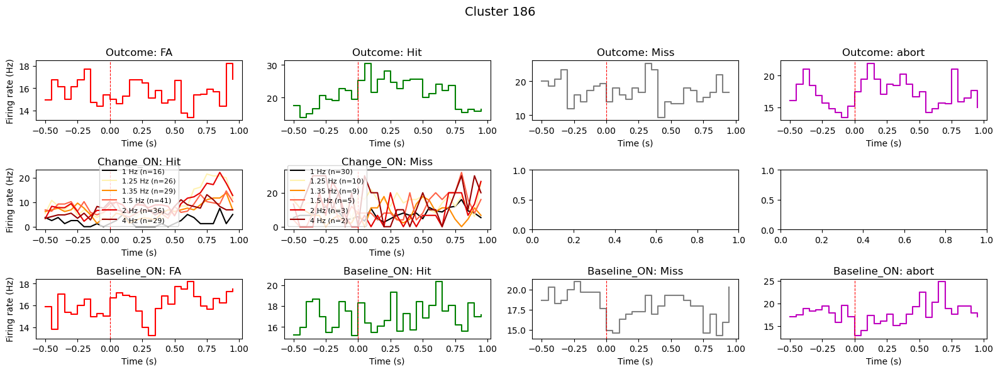

In [22]:
plot_extended_psth_per_cluster(session, show_fig=True)

In [28]:
from scipy.ndimage import gaussian_filter1d

def plot_psth_per_cluster_per_outcome_advanced(
    session,
    window=(-0.5, 1.0),
    bin_size=0.01,
    good_cluster_ids=None,
    output_dir='png_output',
    show_fig=False,
    min_trials_with_spikes=30,
    shift_fa_hit_ms=200.0,
    sigma_sec=0.05,  # smoothing in seconds (50 ms)
    change_size_colors=None
):
    """
    For each good cluster, plot PSTHs for:
    - Each behavioral outcome (FA, Hit, Miss, abort)
    - Change_ON, split by outcome (Hit, Miss), and by change size
    - Baseline_ON, split by outcome (Hit, FA, Miss, abort)
    """
    import os
    import numpy as np
    import matplotlib.pyplot as plt

    if change_size_colors is None:
        change_size_colors = {
            1.25: "#FFF2B1",
            1.35: "#ff8c00",
            1.5: "#ff6347",
            2.0: "#e60000",
            4.0: "#990000"
        }
    outcome_colors = {
        'FA': 'b',
        'Hit': 'g',
        'Miss': 'm',
        'abort': 'r'
    }
    ni_events = getattr(session, 'ni_events', None)
    if ni_events is None:
        print('NI_events not found in session. Cannot align to true event times.')
        return
    all_behav_outcomes = ['FA', 'Hit', 'Miss', 'abort']
    change_on_outcomes = ['Hit', 'Miss']
    baseline_on_outcomes = ['Hit', 'FA', 'Miss', 'abort']
    # Build list of all subplots
    subplot_labels = all_behav_outcomes + \
        [f'Change_ON-{o}' for o in change_on_outcomes] + \
        [f'Baseline_ON-{o}' for o in baseline_on_outcomes]
    n_subplots = len(subplot_labels)
    bins = np.arange(window[0], window[1] + bin_size, bin_size)
    if good_cluster_ids is None:
        if hasattr(session, 'good_cluster_ids') and session.good_cluster_ids is not None:
            good_cluster_ids = list(session.good_cluster_ids)
        else:
            good_cluster_ids = [c.cluster_id for c in session.clusters]
    os.makedirs(output_dir, exist_ok=True)
    for cluster in session.clusters:
        if cluster.cluster_id not in good_cluster_ids:
            continue
        psth_data = []
        n_trials_data = []
        # 1. Behavioral outcomes
        for outcome in all_behav_outcomes:
            event_times = []
            for idx, t in enumerate(session.trials):
                if t.trialoutcome == outcome:
                    et = get_true_reaction_time(t, ni_events, idx, shift_fa_hit_ms=shift_fa_hit_ms)
                    if et is not None and not np.isnan(et):
                        event_times.append(et)
            all_counts = []
            for t_event in event_times:
                aligned_spikes = cluster.spike_times - t_event
                mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                sigma_bins = max(0.0, float(sigma_sec) / float(bin_size))
                if sigma_bins > 0:
                    counts = gaussian_filter1d(counts, sigma=sigma_bins)
                all_counts.append(counts)
            if len(all_counts) == 0:
                all_counts = np.empty((0, len(bins)-1))
            else:
                all_counts = np.atleast_2d(np.array(all_counts))
            psth_data.append(all_counts)
            n_trials_data.append(len(event_times))
        # 2. Change_ON split by outcome and change size
        change_on = ni_events['Change_ON']
        if isinstance(change_on, dict) and 'rise_t' in change_on:
            change_on_times = np.array(change_on['rise_t']).flatten()
        else:
            change_on_times = np.array(change_on).flatten()
        for outcome in change_on_outcomes:
            # For each change size, plot a line
            change_sizes = sorted(set(t.change_size for t in session.trials if t.change_size is not None))
            psth_by_size = {}
            n_trials_by_size = {}
            for cs in change_sizes:
                # Get indices of trials with this outcome and change size
                trial_indices = [i for i, t in enumerate(session.trials) if t.trialoutcome == outcome and t.change_size == cs]
                event_times = change_on_times[trial_indices] if len(trial_indices) > 0 else []
                all_counts = []
                for t_event in event_times:
                    aligned_spikes = cluster.spike_times - t_event
                    mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                    counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                    sigma_bins = max(0.0, float(sigma_sec) / float(bin_size))
                    if sigma_bins > 0:
                        counts = gaussian_filter1d(counts, sigma=sigma_bins)
                    all_counts.append(counts)
                if len(all_counts) == 0:
                    mean_psth = np.zeros(len(bins)-1)
                else:
                    mean_psth = np.mean(np.array(all_counts), axis=0) / bin_size  # Convert to Hz
                psth_by_size[cs] = mean_psth
                n_trials_by_size[cs] = len(event_times)
            psth_data.append(psth_by_size)
            n_trials_data.append(n_trials_by_size)
        # 3. Baseline_ON split by outcome
        baseline_on = ni_events['Baseline_ON']
        if isinstance(baseline_on, dict) and 'rise_t' in baseline_on:
            baseline_on_times = np.array(baseline_on['rise_t']).flatten()
        else:
            baseline_on_times = np.array(baseline_on).flatten()
        for outcome in baseline_on_outcomes:
            trial_indices = [i for i, t in enumerate(session.trials) if t.trialoutcome == outcome]
            event_times = baseline_on_times[trial_indices] if len(trial_indices) > 0 else []
            all_counts = []
            for t_event in event_times:
                aligned_spikes = cluster.spike_times - t_event
                mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                sigma_bins = max(0.0, float(sigma_sec) / float(bin_size))
                if sigma_bins > 0:
                    counts = gaussian_filter1d(counts, sigma=sigma_bins)
                all_counts.append(counts)
            if len(all_counts) == 0:
                all_counts = np.empty((0, len(bins)-1))
            else:
                all_counts = np.atleast_2d(np.array(all_counts))
            psth_data.append(all_counts)
            n_trials_data.append(len(event_times))
        # Check if we have enough spikes for any of the outcomes
        enough_spikes = False
        for i, counts in enumerate(psth_data):
            if isinstance(counts, dict):
                # Change_ON split by size
                if any(n >= min_trials_with_spikes for n in n_trials_data[i].values()):
                    enough_spikes = True
            else:
                # Regular outcomes
                if counts.shape[0] > 0 and np.sum(np.sum(counts, axis=1) > 0) >= min_trials_with_spikes:
                    enough_spikes = True
        if not enough_spikes:
            continue
        # Plotting
        fig, axes = plt.subplots(1, n_subplots, figsize=(4*n_subplots, 3), sharey=False)
        if n_subplots == 1:
            axes = [axes]
        for i, (label, data, n_trials) in enumerate(zip(subplot_labels, psth_data, n_trials_data):
            ax = axes[i]
            if label.startswith('Change_ON'):
                # Multiple lines for each change size
                for cs in sorted(data.keys()):
                    if cs == 1:  # No change
                        color = 'b'
                    else:
                        color = change_size_colors.get(cs, 'k')
                    ax.plot(bins[:-1], data[cs], color=color, label=f'{cs} Hz (n={n_trials[cs]})')
                ax.legend(fontsize=8)
            else:
                # Single mean PSTH
                if data.shape[0] > 0:
                    mean_psth = np.mean(data, axis=0) / bin_size  # Convert to Hz
                    # Use outcome color if available
                    outcome = label.split('-')[-1] if '-' in label else label
                    color = outcome_colors.get(outcome, 'k')
                    ax.step(bins[:-1], mean_psth, where='post', color=color)
            ax.axvline(0, color='r', linestyle='--', lw=0.8)
            ax.set_title(f'{label} (n={n_trials if isinstance(n_trials,int) else sum(n_trials.values())})')
            ax.set_xlabel('Time from event (s)')
            if i == 0:
                ax.set_ylabel('Firing rate (Hz)')
        fig.suptitle(f'Cluster {cluster.cluster_id}')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        save_path = os.path.join(output_dir, f'cluster_{cluster.cluster_id}_psth_advanced.png')
        plt.savefig(save_path, dpi=120)
        if show_fig:
            plt.show()
        plt.close(fig)


SyntaxError: invalid syntax (1476843427.py, line 159)

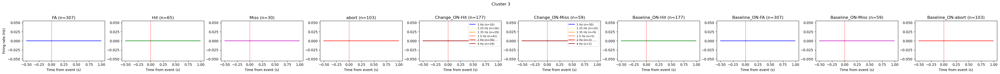

KeyboardInterrupt: 

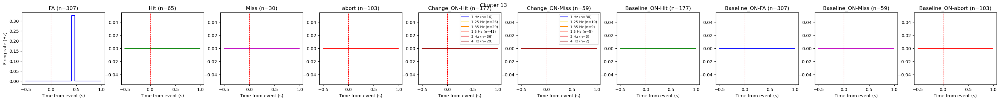

In [18]:
plot_psth_per_cluster_per_outcome_advanced(session, show_fig=True)

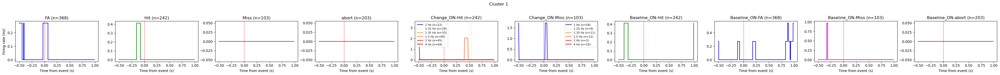

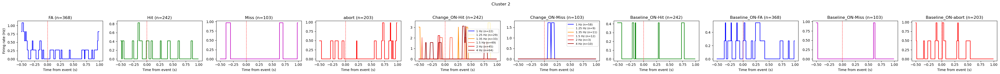

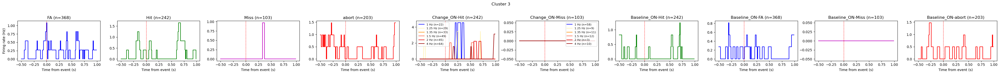

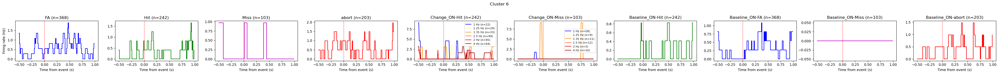

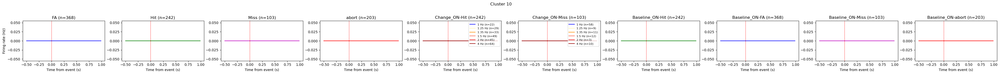

...

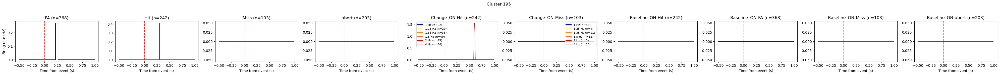

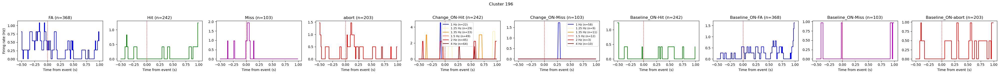

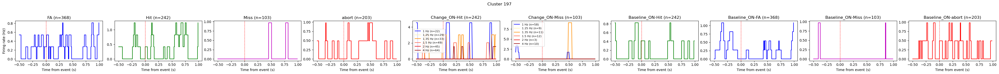

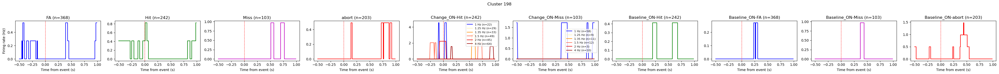

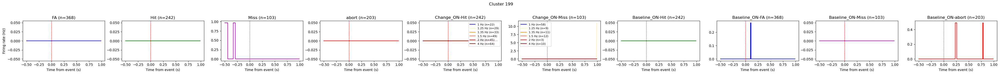

KeyboardInterrupt: 

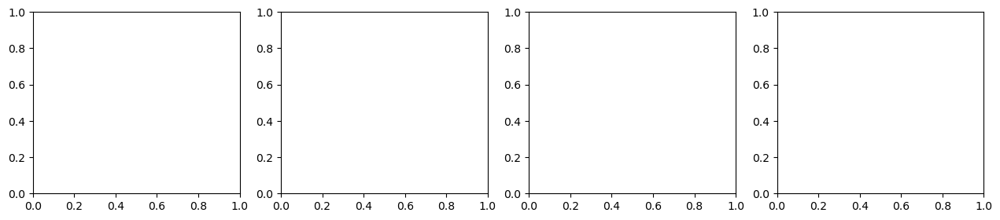

In [ ]:
plot_psth_per_cluster_per_outcome_advanced(session, show_fig=True)

c:\Users\Ben\anaconda3\envs\myenv\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Ben\anaconda3\envs\myenv\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


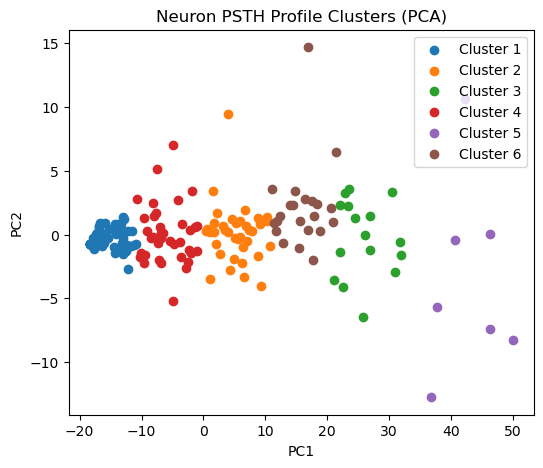

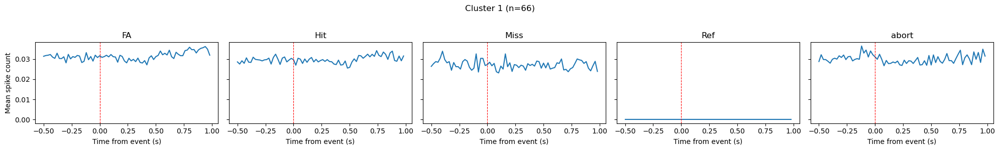

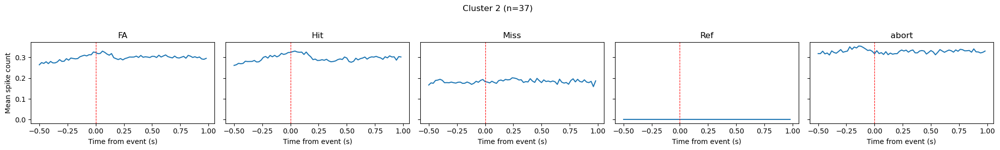

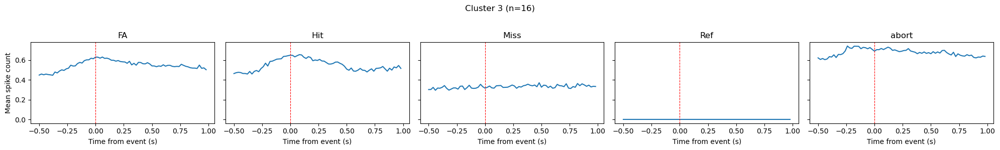

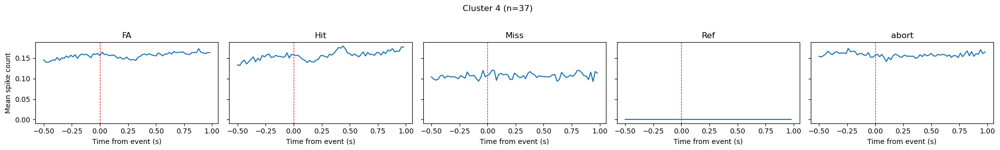

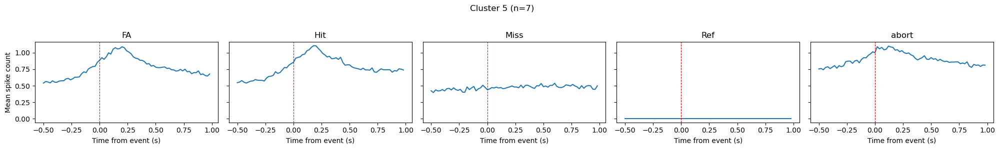

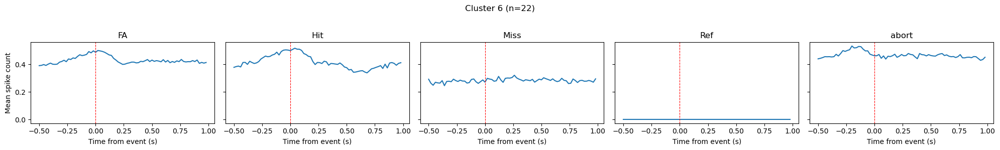

In [ ]:
# --- Feature Extraction and Clustering of Neuron PSTH Profiles ---
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# 1. Extract PSTH features for each cluster (concatenate mean PSTH for each outcome)
def extract_psth_features(session, outcomes=None, window=(-0.5, 1.0), bin_size=0.02, good_cluster_ids=None, shift_fa_hit_ms=200.0):
    ni_events = getattr(session, 'ni_events', None)
    if ni_events is None:
        raise ValueError('NI_events not found in session.')
    if outcomes is None:
        outcomes = sorted(set(t.trialoutcome for t in session.trials))
    if good_cluster_ids is None:
        good_cluster_ids = session.good_cluster_ids if session.good_cluster_ids is not None else [c.cluster_id for c in session.clusters]
    bins = np.arange(window[0], window[1] + bin_size, bin_size)
    features = []
    cluster_ids = []
    for cluster in session.clusters:
        if cluster.cluster_id not in good_cluster_ids:
            continue
        cluster_profile = []
        for outcome in outcomes:
            event_times = [
                get_true_reaction_time(t, ni_events, idx, shift_fa_hit_ms=shift_fa_hit_ms)
                for idx, t in enumerate(session.trials) if t.trialoutcome == outcome
            ]
            event_times = [et for et in event_times if et is not None and not np.isnan(et)]
            all_counts = []
            for t_event in event_times:
                aligned_spikes = cluster.spike_times - t_event
                mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                all_counts.append(counts)
            if len(all_counts) == 0:
                mean_psth = np.zeros(len(bins)-1)
            else:
                mean_psth = np.mean(np.array(all_counts), axis=0)
            cluster_profile.append(mean_psth)
        # Concatenate all outcomes for this cluster
        features.append(np.concatenate(cluster_profile))
        cluster_ids.append(cluster.cluster_id)
    return np.array(features), cluster_ids, outcomes, bins

# 2. Run clustering (k-means) and visualize
features, cluster_ids, outcomes, bins = extract_psth_features(session)

# Normalize features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Optionally reduce dimensionality for visualization
pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_scaled)

# Choose number of clusters (e.g., 4)
n_clusters = 6
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
labels = kmeans.fit_predict(features_scaled)

# Plot clusters in PCA space
plt.figure(figsize=(6,5))
for i in range(n_clusters):
    plt.scatter(features_pca[labels==i,0], features_pca[labels==i,1], label=f'Cluster {i+1}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Neuron PSTH Profile Clusters (PCA)')
plt.legend()
plt.show()

# Plot average PSTH per cluster (per outcome)
for i in range(n_clusters):
    idxs = np.where(labels == i)[0]
    if len(idxs) == 0:
        continue
    mean_profile = np.mean(features[idxs], axis=0)
    fig, axes = plt.subplots(1, len(outcomes), figsize=(4*len(outcomes), 3), sharey=True)
    if len(outcomes) == 1:
        axes = [axes]
    split = np.array_split(mean_profile, len(outcomes))
    for j, (ax, psth) in enumerate(zip(axes, split)):
        ax.plot(bins[:-1], psth)
        ax.axvline(0, color='r', linestyle='--', lw=0.8)
        ax.set_title(f'{outcomes[j]}')
        ax.set_xlabel('Time from event (s)')
        if j == 0:
            ax.set_ylabel('Mean spike count')
    fig.suptitle(f'Cluster {i+1} (n={len(idxs)})')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

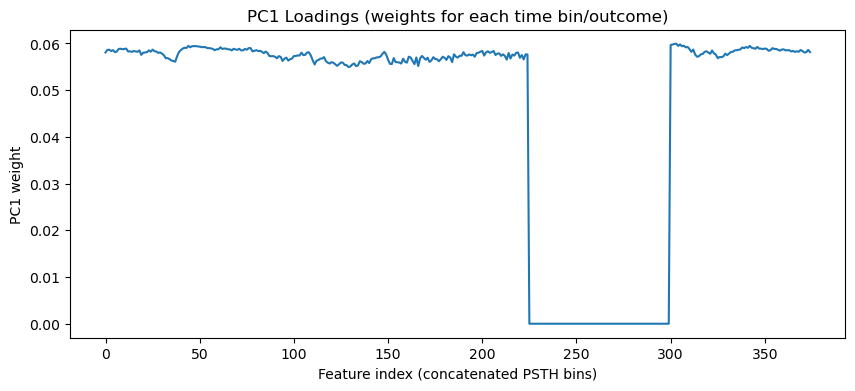

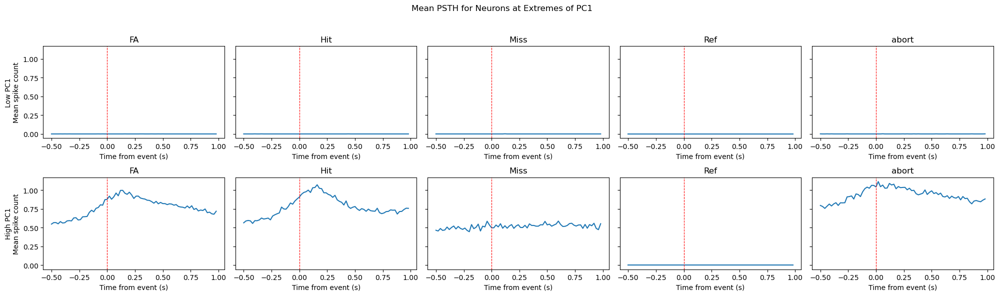

In [ ]:
# --- Inspect PC1 loadings and plot mean PSTH for extremes ---
import matplotlib.pyplot as plt
import numpy as np

# 1. Inspect PC1 loadings
plt.figure(figsize=(10,4))
plt.plot(pca.components_[0])
plt.title('PC1 Loadings (weights for each time bin/outcome)')
plt.xlabel('Feature index (concatenated PSTH bins)')
plt.ylabel('PC1 weight')
plt.show()

# 2. Plot mean PSTH for neurons at the extremes of PC1
n_extreme = 10  # number of neurons at each extreme
pc1_scores = features_scaled @ pca.components_[0]
idx_low = np.argsort(pc1_scores)[:n_extreme]
idx_high = np.argsort(pc1_scores)[-n_extreme:]

# Helper to plot mean PSTH split by outcome
fig, axes = plt.subplots(2, len(outcomes), figsize=(4*len(outcomes), 6), sharey=True)
for row, idxs, label in zip([0,1], [idx_low, idx_high], ['Low PC1', 'High PC1']):
    mean_profile = np.mean(features[idxs], axis=0)
    split = np.array_split(mean_profile, len(outcomes))
    for j, (ax, psth) in enumerate(zip(axes[row], split)):
        ax.plot(bins[:-1], psth)
        ax.axvline(0, color='r', linestyle='--', lw=0.8)
        ax.set_title(f'{outcomes[j]}')
        ax.set_xlabel('Time from event (s)')
        if j == 0:
            ax.set_ylabel(f'{label}\nMean spike count')
fig.suptitle('Mean PSTH for Neurons at Extremes of PC1')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [18]:
os.chdir('e:\\python_analysis\\git_repos\\vis_detect_analysis_Sep2025')

In [25]:
session =hp.load_session_from_file('./data/BG_046_12082025.pkl')

In [26]:
# Count Hit/Miss trials with NaN Change_ON in raw NI_events
import numpy as np

def _to_1d_array(v):
    if v is None:
        return np.array([])
    if isinstance(v, dict) and 'rise_t' in v:
        return np.array(v['rise_t']).flatten()
    return np.array(v).flatten()

ni = getattr(session, 'ni_events', {}) or {}
change_on_raw = ni.get('Change_ON', None)
change_arr = _to_1d_array(change_on_raw)
n_trials = len(getattr(session, 'trials', []))
n_to_check = min(n_trials, change_arr.size)

hit_total = hit_nan = 0
miss_total = miss_nan = 0
hit_nan_indices = []
miss_nan_indices = []

for i in range(n_to_check):
    t = session.trials[i]
    outcome = getattr(t, 'trialoutcome', None)
    val = change_arr[i] if i < change_arr.size else np.nan
    # robust NaN check even for object dtype
    try:
        is_nan = np.isnan(float(val))
    except Exception:
        is_nan = False
    if outcome == 'Hit':
        hit_total += 1
        if is_nan:
            hit_nan += 1
            hit_nan_indices.append(i)
    elif outcome == 'Miss':
        miss_total += 1
        if is_nan:
            miss_nan += 1
            miss_nan_indices.append(i)

print(f"Total trials: {n_trials}")
print(f"Change_ON array length: {change_arr.size}")
print(f"Checked first {n_to_check} entries (min of trials and Change_ON length)")
print("")
print(f"Hit trials: {hit_total}, Hit Change_ON NaN: {hit_nan} ({(hit_nan/(hit_total or 1))*100:.1f}%)")
print(f"Miss trials: {miss_total}, Miss Change_ON NaN: {miss_nan} ({(miss_nan/(miss_total or 1))*100:.1f}%)")

# Optional: show a few indices
print("\nFirst 10 Hit indices with NaN Change_ON:", hit_nan_indices[:10])
print("First 10 Miss indices with NaN Change_ON:", miss_nan_indices[:10])

Total trials: 652
Change_ON array length: 652
Checked first 652 entries (min of trials and Change_ON length)

Hit trials: 92, Hit Change_ON NaN: 0 (0.0%)
Miss trials: 197, Miss Change_ON NaN: 0 (0.0%)

First 10 Hit indices with NaN Change_ON: []
First 10 Miss indices with NaN Change_ON: []
